#Problem STAtement


Flight ticket prices can be something hard to guess, today we might see a price, check out the price of the same flight tomorrow, it will be a different story. We might have often heard travellers saying that flight ticket prices are so unpredictable. Here you will be provided with prices of flight tickets for various airlines between the months of March and June of 2019 and between various cities.

Size of training set: 10683 records
Size of test set: 2671 records

In [119]:
#importing libraries
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [120]:
# Importing dataset
import pandas as pd
df = pd.read_excel(r"C:\Users\Rahul\Downloads\flight prediction\Data_Train.xlsx")
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
5,SpiceJet,24/06/2019,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,non-stop,No info,3873
6,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,18:55,10:25 13 Mar,15h 30m,1 stop,In-flight meal not included,11087
7,Jet Airways,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:00,05:05 02 Mar,21h 5m,1 stop,No info,22270
8,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:55,10:25 13 Mar,25h 30m,1 stop,In-flight meal not included,11087
9,Multiple carriers,27/05/2019,Delhi,Cochin,DEL → BOM → COK,11:25,19:15,7h 50m,1 stop,No info,8625


In [121]:
df.shape

(10683, 11)

In [4]:
#Their are 10683 rows and 11 columns in dataset

In [122]:
#for displaying max. rows
pd.set_option('display.max_rows', None)

In [123]:
# checking Dataset info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


In [124]:
#checking datatype
df.dtypes

Airline            object
Date_of_Journey    object
Source             object
Destination        object
Route              object
Dep_Time           object
Arrival_Time       object
Duration           object
Total_Stops        object
Additional_Info    object
Price               int64
dtype: object

In [8]:
#Two types of data type present in dataset. 1. integer, 2. object

In [125]:
#checking null values
df.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

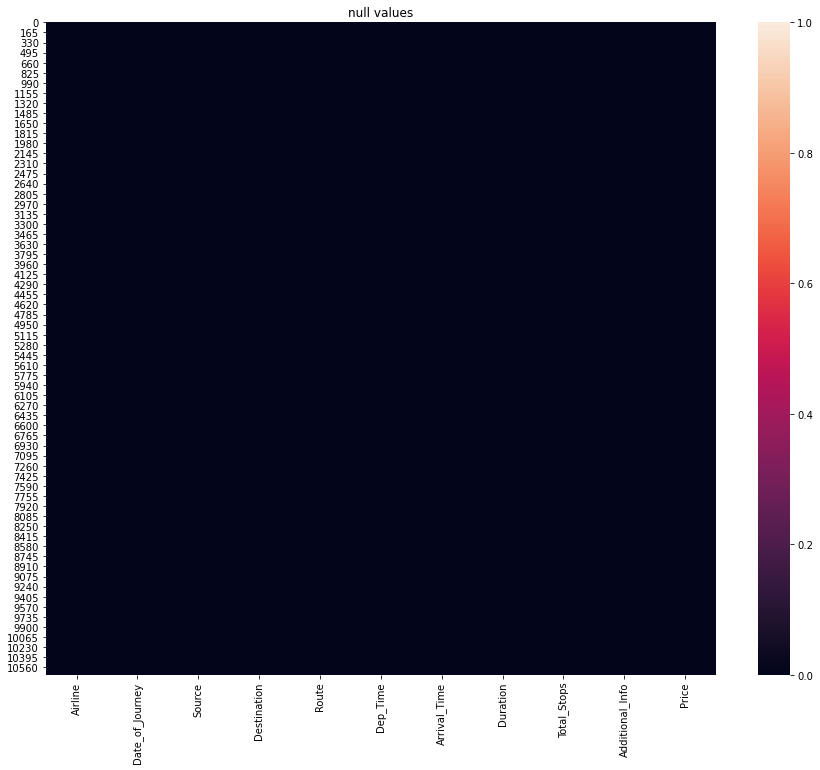

In [126]:
#Heatmap for checking null values
plt.figure(figsize = [15,12])
sns.heatmap(df.isnull())
plt.title("null values")
plt.show()

In [11]:
# By seeing above graph no white lines have been observed, no null values present, whereas single null values have observed using code in two cols. but as its only single values, i deceided not to trat them

In [127]:
#Converting object type data into integers
encode = LabelEncoder() 
for i in df.columns:
    if df[i].dtype=="object":
        df[i]=encode.fit_transform(df[i])

In [128]:
#checking columns name
df.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info', 'Price'],
      dtype='object')

In [129]:
#multivariate analysis
corr_mat=df.corr()
corr_mat

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
Airline,1.000000,0.022251,-0.013401,0.018479,0.025039,-0.039439,-0.015733,0.027917,0.035732,-0.060802,-0.039520
Date_of_Journey,0.022251,1.000000,0.167549,-0.273357,0.275233,-0.007836,-0.012507,-0.001168,-0.043846,0.008382,-0.036942
Source,-0.013401,0.167549,1.000000,-0.592574,0.403378,0.055191,0.020844,-0.192009,-0.225557,-0.022107,0.015998
Destination,0.018479,-0.273357,-0.592574,1.000000,-0.461169,-0.063608,-0.036830,0.022037,0.337756,0.026806,-0.071112
Route,0.025039,0.275233,0.403378,-0.461169,1.000000,-0.082080,0.010523,-0.062111,-0.437362,0.035216,0.164085
Dep_Time,-0.039439,-0.007836,0.055191,-0.063608,-0.082080,1.000000,-0.023294,0.041619,0.044536,-0.052853,0.002949
Arrival_Time,-0.015733,-0.012507,0.020844,-0.036830,0.010523,-0.023294,1.000000,0.027746,-0.097269,0.017505,0.027377
Duration,0.027917,-0.001168,-0.192009,0.022037,-0.062111,0.041619,0.027746,1.000000,0.175106,0.080151,-0.144270
Total_Stops,0.035732,-0.043846,-0.225557,0.337756,-0.437362,0.044536,-0.097269,0.175106,1.000000,0.164114,-0.571179
Additional_Info,-0.060802,0.008382,-0.022107,0.026806,0.035216,-0.052853,0.017505,0.080151,0.164114,1.000000,-0.065478


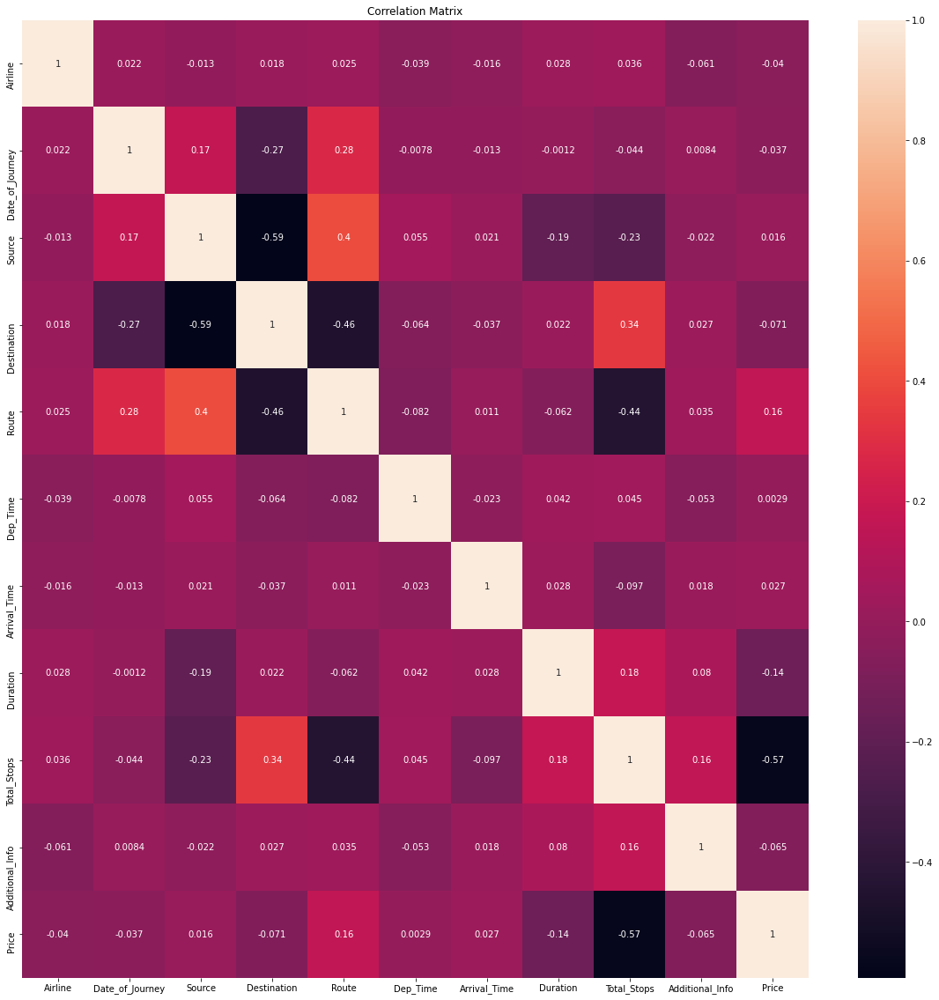

In [130]:
# heatmap for analysing correlation
plt.figure(figsize=[20,20])
sns.heatmap(corr_mat,annot=True)
plt.title("Correlation Matrix")
plt.show()

In [131]:
# for better understanding correalation with target col
corr_mat=df.corr()
corr_mat["Price"].sort_values(ascending=False)

Price              1.000000
Route              0.164085
Arrival_Time       0.027377
Source             0.015998
Dep_Time           0.002949
Date_of_Journey   -0.036942
Airline           -0.039520
Additional_Info   -0.065478
Destination       -0.071112
Duration          -0.144270
Total_Stops       -0.571179
Name: Price, dtype: float64

In [17]:
#highest correlation observed with column name- Route(0.164085)
#both positive and negative correlation has been observed.

<function matplotlib.pyplot.show(close=None, block=None)>

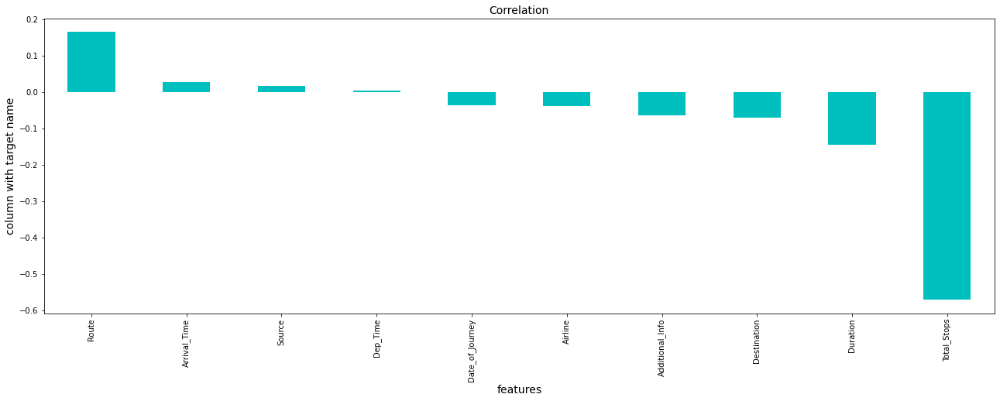

In [132]:
#plotting graph showing +ve and -ve correlation
plt.figure(figsize=(22,7))
df.corr()['Price'].sort_values(ascending=False).drop(['Price']).plot(kind='bar',color='c')
plt.xlabel('features', fontsize=14)
plt.ylabel('column with target name', fontsize=14)
plt.title('Correlation', fontsize=14)
plt.show

In [133]:
df.describe()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
count,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000
mean,3.965927,23.735093,1.952261,1.436113,74.825143,107.980717,869.828419,194.069269,1.458579,7.393054,9087.064121
std,2.352155,12.337763,1.177221,1.474782,36.730924,61.085563,331.509504,108.620556,1.806560,1.214211,4611.359167
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1759.000000
25%,3.000000,14.000000,2.000000,0.000000,48.000000,55.000000,603.000000,106.000000,0.000000,8.000000,5277.000000
50%,4.000000,24.000000,2.000000,1.000000,73.000000,96.000000,937.000000,233.000000,0.000000,8.000000,8372.000000
75%,4.000000,35.000000,3.000000,2.000000,104.000000,164.000000,1141.000000,280.000000,4.000000,8.000000,12373.000000
max,11.000000,43.000000,4.000000,5.000000,128.000000,221.000000,1342.000000,367.000000,5.000000,9.000000,79512.000000


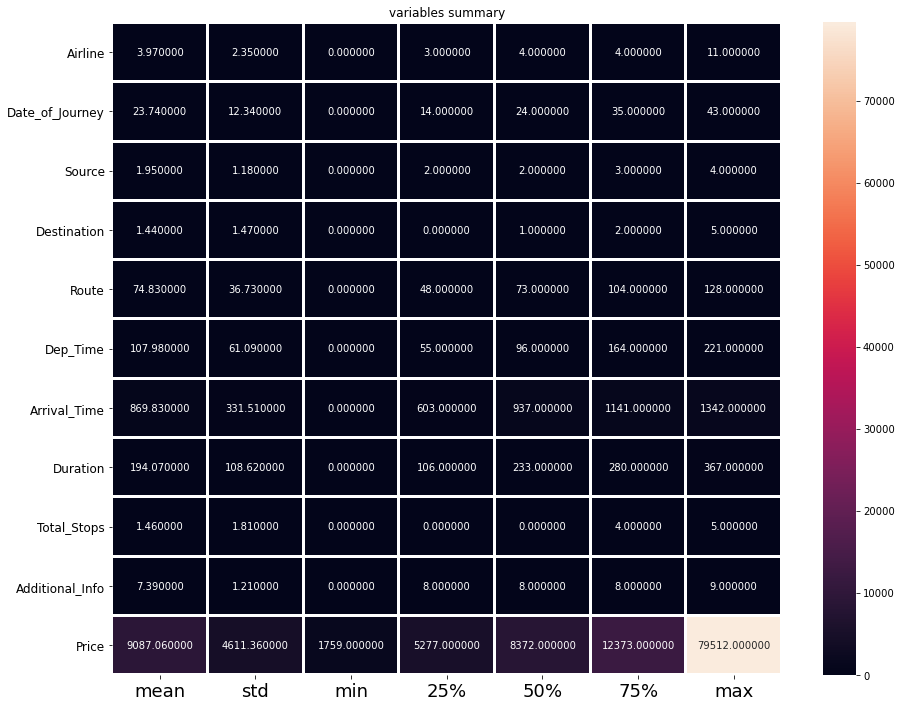

In [134]:
plt.figure(figsize=(15,12))
sns.heatmap(round(df.describe()[1:].transpose(),2), linewidth=2, annot=True, fmt="f")
plt.xticks(fontsize=18)
plt.yticks(fontsize=12)
plt.title("variables summary")
plt.show()

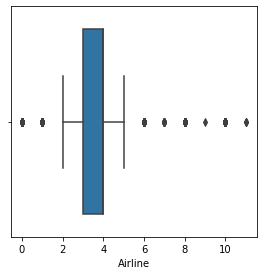

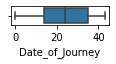

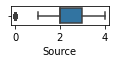

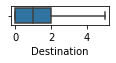

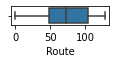

...

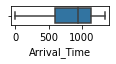

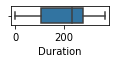

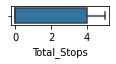

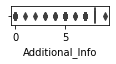

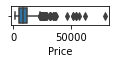

In [17]:
#checking outliers
plt.figure(figsize=(15,50))
graph=1
for column in df:
    if graph<=30:
        ax=plt.subplot(10,3,graph)
        sns.boxplot(df[column], orient='v')
        plt.xlabel(column, fontsize=10)
    graph+=1
    plt.show()

In [18]:
#outliers is present in some columns
# not treating outliers as all columns except Price are object type (categorical data), and Price column is our target variable

In [19]:
#checking for continous values
df.Airline.unique()

array([ 3,  1,  4,  8,  6,  2, 10,  0, 11,  5,  7,  9])

In [20]:
df.Source.unique()

array([0, 3, 2, 1, 4])

In [21]:
df.Additional_Info.unique()

array([8, 5, 7, 1, 6, 0, 4, 3, 9, 2])

In [25]:
# Checked for contionous columns for treating outliers but no outliers present in continous columns, treating them is not required

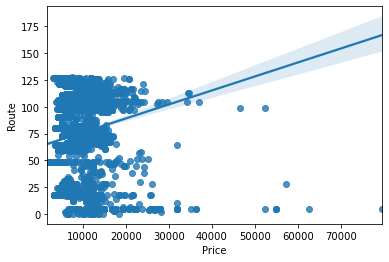

In [22]:
#plot for understanding relation between target col
ax=sns.regplot(x='Price', y='Route',data=df)

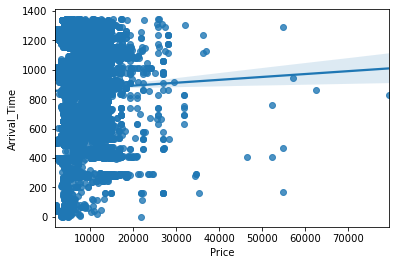

In [23]:
#plot for understanding relation between target col.
ax=sns.regplot(x='Price', y='Arrival_Time',data=df)

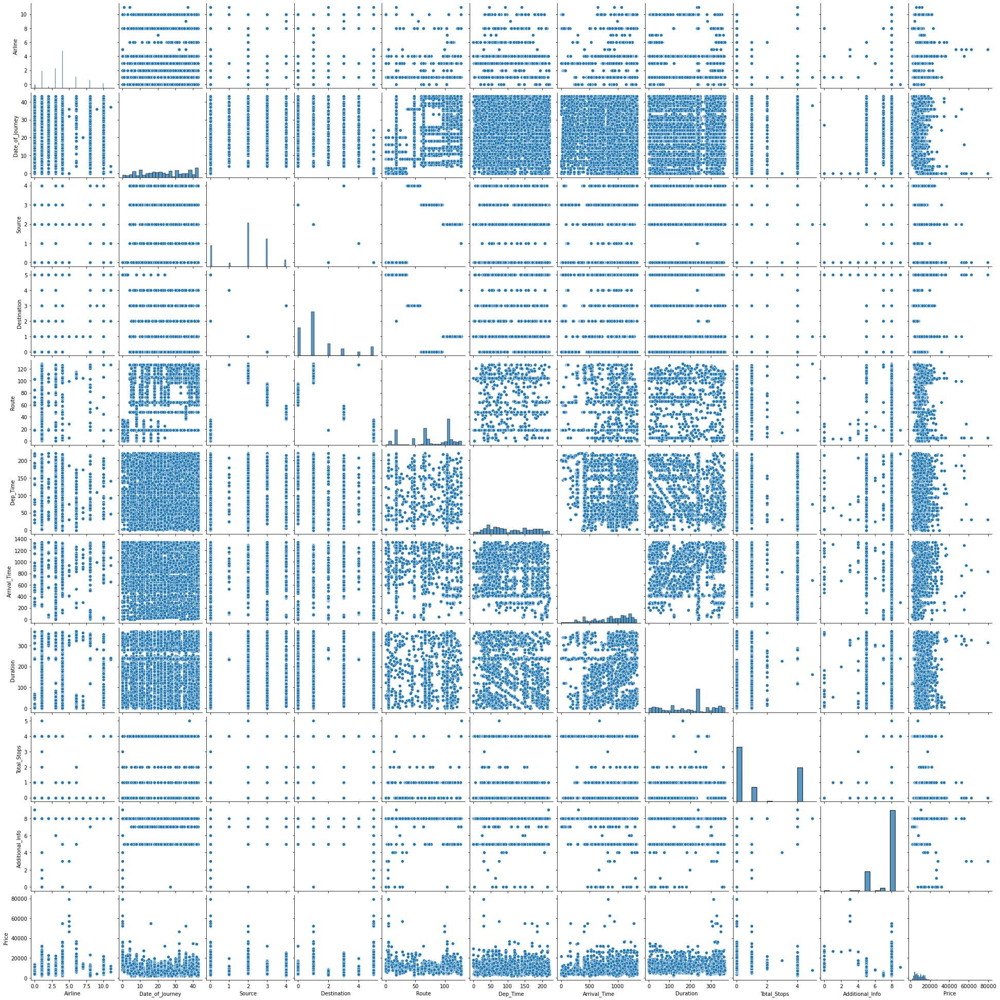

In [24]:
##plot for understanding relation between cols.
sns.pairplot(df)
plt.show()

In [29]:
#Building Regression model using Target variable-Price

In [25]:
#splitting data
x=df.drop("Price", axis=1)
y=df["Price"]

In [26]:
#Checking skewness
x.skew()

Airline            0.731095
Date_of_Journey   -0.070888
Source            -0.424054
Destination        1.244169
Route             -0.501909
Dep_Time           0.195055
Arrival_Time      -0.606530
Duration          -0.213427
Total_Stops        0.631375
Additional_Info   -1.779838
dtype: float64

In [32]:
#skewness is observed in cols: 1, Airline, 2. Destination, 3. Arrival_Time, 4.Additional_Info

In [27]:
#checking for continous values
df.Destination.unique()

array([5, 0, 1, 4, 2, 3])

In [28]:
df.Arrival_Time.unique()

array([ 233,  906,  413, ...,  495,   25, 1235])

In [29]:
# All above columns showing skewness not having contionus values, henece they are not continous columns
#Thatswhy i am not treating them for skewness

In [30]:
#splitling into tRain and test
from sklearn.model_selection import train_test_split

In [31]:
#scaling data
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)

In [32]:
#creating train test split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.25)

In [33]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import  r2_score

In [34]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

model_RFR = RandomForestRegressor(max_depth=10)

model_RFR.fit(x_train, y_train)

predict_train = model_RFR.predict(x_train)
predict_test = model_RFR.predict(x_train)

print('RMSE on train data: ', mean_squared_error(y_train, predict_train)**(0.5))
print('RMSE on test data: ', mean_squared_error(y_train, predict_test)**(0.5))

RMSE on train data:  1507.2823086407898
RMSE on test data:  1507.2823086407898


In [47]:
#DTR Model
dt=DecisionTreeRegressor()
dt.fit(x_train,y_train)
y_pred = dt.predict(x_test)
mse = mean_squared_error(y_pred,y_test)
r2score = r2_score(y_pred,y_test)
print(r2score)
print(mse)

0.7926924867958755
4002470.8124610013


In [48]:
#model-RFR
rfr = RandomForestRegressor()
rfr.fit(x_train,y_train)
y_pred = rfr.predict(x_test)
mse = mean_squared_error(y_pred,y_test)
r2score = r2_score(y_pred,y_test)
print(r2score)
print(mse)

0.8339102523421831
2892954.025874549


In [37]:
#XGB
from sklearn.ensemble import GradientBoostingRegressor
GBR=GradientBoostingRegressor()
GBR.fit(x_train,y_train)
y_pred = GBR.predict(x_test)
mse = mean_squared_error(y_pred,y_test)
r2score = r2_score(y_pred,y_test)
print(r2score)
print(mse)

0.7015564150128746
4087543.292075851


In [71]:
#LinearRegression
from sklearn.ensemble import AdaBoostRegressor
AD=AdaBoostRegressor()
AD.fit(x_train,y_train)
y_pred = lr.predict(x_test)
mse = mean_squared_error(y_pred,y_test)
r2score = r2_score(y_pred,y_test)
print(r2score)
print(mse)

-0.6407919666183552
12656734.146398116


In [39]:
#KNeighborsRegressor
from sklearn.neighbors import KNeighborsRegressor
knn=KNeighborsRegressor()
knn.fit(x_train,y_train)
y_pred = knn.predict(x_test)
mse = mean_squared_error(y_pred,y_test)
r2score = r2_score(y_pred,y_test)
print(r2score)
print(mse)

0.6378042784754072
5870548.2166828895


In [57]:
from sklearn.model_selection import cross_val_score
scr=cross_val_score(dt, x, y, cv=3)
print("Cross validation score of DecisionTree model :", scr.mean())

Cross validation score of DecisionTree model : 0.7913781282687272


In [58]:
scr=cross_val_score(rfr, x, y, cv=3)
print("Cross validation score of RandomForestRegressor model :", scr.mean())

Cross validation score of RandomForestRegressor model : 0.8417953110708404


In [59]:
scr=cross_val_score(GBR, x, y, cv=3)
print("Cross validation score of GradientBoostingRegressor :", scr.mean())

Cross validation score of GradientBoostingRegressor : 0.8011056436563999


In [60]:
scr=cross_val_score(lr, x, y, cv=3)
print("Cross validation score of linearregression :", scr.mean())

Cross validation score of linearregression : 0.35285457359413375


In [61]:
scr=cross_val_score(knn, x, y, cv=3)
print("Cross validation score of KNeighborsRegressor :", scr.mean())

Cross validation score of KNeighborsRegressor : 0.6914935311303761


In [62]:
#Best model Hypertunning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

In [85]:
#Decision Tree regressor
parameters = {'criterion' :['mse', 'mae','poisson'],
             'max_depth':[2,3,4,5,6,7,8],
             'max_features': ['sqrt', 'auto', 'log']}

In [86]:
GCV = GridSearchCV(DecisionTreeRegressor(),parameters,cv=3)

In [87]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['mse', 'mae', 'poisson'],
                         'max_depth': [2, 3, 4, 5, 6, 7, 8],
                         'max_features': ['sqrt', 'auto', 'log']})

In [88]:
GCV.best_params_

{'criterion': 'mse', 'max_depth': 8, 'max_features': 'auto'}

In [91]:
mod=DecisionTreeRegressor(criterion='mse', max_depth=8, max_features='auto')

mod.fit(x_train,y_train)
pred=mod.predict(x_test)
print(r2_score(y_test,pred)*100)

73.35353334464041


In [92]:
#saving model
import joblib
joblib.dump(mod,"Flight Price prediction.pkl")

['Flight Price prediction.pkl']

# IMPORTING TEST DATASET for processing

In [93]:
#importing test dataset
import pandas as pd
df = pd.read_excel(r"C:\Users\Rahul\Downloads\flight prediction\Test_set.xlsx")
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info
5,Jet Airways,12/06/2019,Delhi,Cochin,DEL → BOM → COK,18:15,12:35 13 Jun,18h 20m,1 stop,In-flight meal not included
6,Air India,12/03/2019,Banglore,New Delhi,BLR → TRV → DEL,07:30,22:35,15h 5m,1 stop,No info
7,IndiGo,1/05/2019,Kolkata,Banglore,CCU → HYD → BLR,15:15,20:30,5h 15m,1 stop,No info
8,IndiGo,15/03/2019,Kolkata,Banglore,CCU → BLR,10:10,12:55,2h 45m,non-stop,No info
9,Jet Airways,18/05/2019,Kolkata,Banglore,CCU → BOM → BLR,16:30,22:35,6h 5m,1 stop,No info


In [94]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2671 entries, 0 to 2670
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          2671 non-null   object
 1   Date_of_Journey  2671 non-null   object
 2   Source           2671 non-null   object
 3   Destination      2671 non-null   object
 4   Route            2671 non-null   object
 5   Dep_Time         2671 non-null   object
 6   Arrival_Time     2671 non-null   object
 7   Duration         2671 non-null   object
 8   Total_Stops      2671 non-null   object
 9   Additional_Info  2671 non-null   object
dtypes: object(10)
memory usage: 208.8+ KB


In [95]:
# Checking datatypes
df.dtypes

Airline            object
Date_of_Journey    object
Source             object
Destination        object
Route              object
Dep_Time           object
Arrival_Time       object
Duration           object
Total_Stops        object
Additional_Info    object
dtype: object

In [ ]:
# all colunms have same data type- i.e. object

In [96]:
#checking null values
df.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
dtype: int64

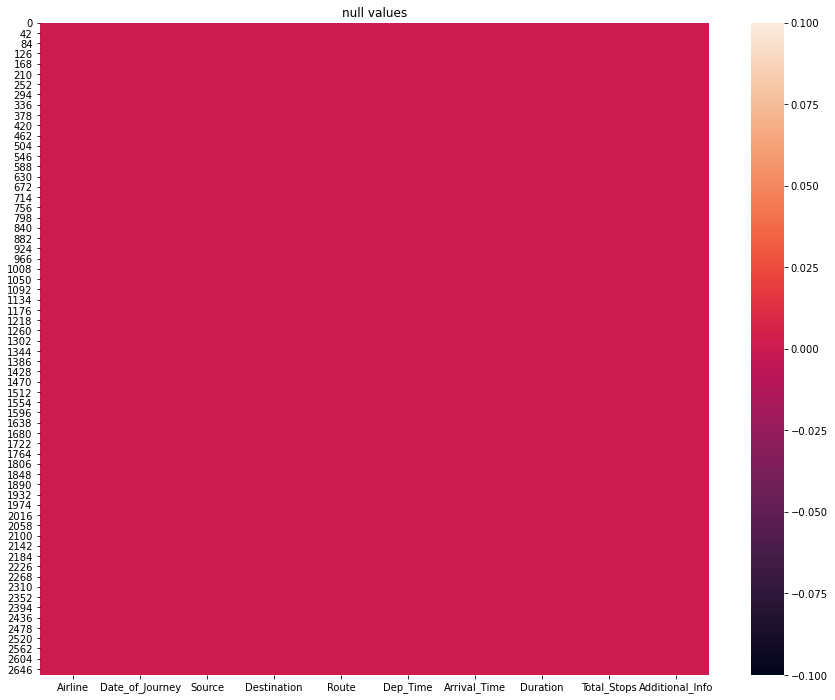

In [98]:
#Heatmap for checking null values
plt.figure(figsize = [15,12])
sns.heatmap(df.isnull())
plt.title("null values")
plt.show()

In [ ]:
#no null values has been observed

In [99]:
#Converting object type data into integers
encode = LabelEncoder() 
for i in df.columns:
    if df[i].dtype=="object":
        df[i]=encode.fit_transform(df[i])

In [100]:
#multivariate analysis
corr_mat=df.corr()
corr_mat

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
Airline,1.000000,0.018772,-0.031107,0.033630,0.023995,-0.000056,-0.019198,0.027559,0.039236,-0.084423
Date_of_Journey,0.018772,1.000000,0.146850,-0.260489,0.247562,-0.023362,-0.009460,-0.013174,-0.042129,0.034785
Source,-0.031107,0.146850,1.000000,-0.578296,0.339434,0.048534,-0.002197,-0.169256,-0.212995,-0.025205
Destination,0.033630,-0.260489,-0.578296,1.000000,-0.444760,-0.035993,-0.004226,-0.007661,0.331240,0.026295
Route,0.023995,0.247562,0.339434,-0.444760,1.000000,-0.146110,-0.004257,-0.053478,-0.441772,0.059682
Dep_Time,-0.000056,-0.023362,0.048534,-0.035993,-0.146110,1.000000,-0.007133,0.073045,0.080940,-0.070610
Arrival_Time,-0.019198,-0.009460,-0.002197,-0.004226,-0.004257,-0.007133,1.000000,0.048875,-0.094387,0.016033
Duration,0.027559,-0.013174,-0.169256,-0.007661,-0.053478,0.073045,0.048875,1.000000,0.197855,0.051093
Total_Stops,0.039236,-0.042129,-0.212995,0.331240,-0.441772,0.080940,-0.094387,0.197855,1.000000,0.136402
Additional_Info,-0.084423,0.034785,-0.025205,0.026295,0.059682,-0.070610,0.016033,0.051093,0.136402,1.000000


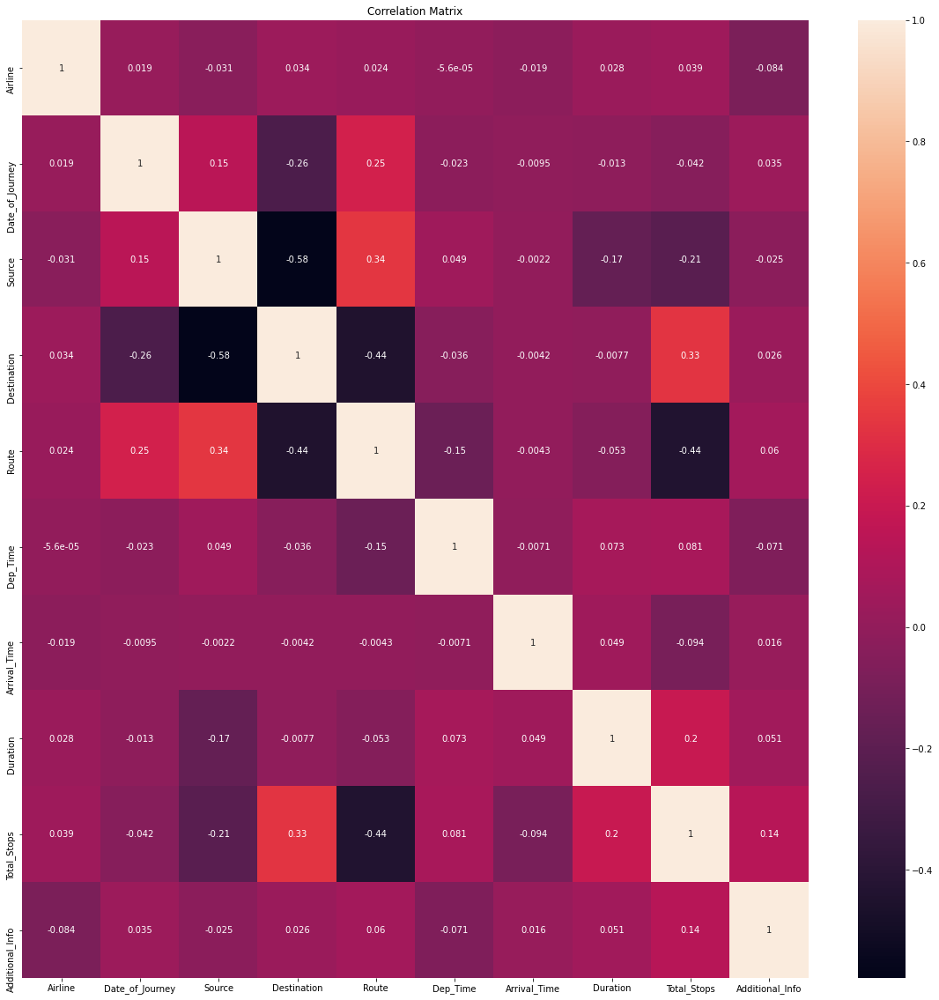

In [101]:
# heatmap for analysing correlation
plt.figure(figsize=[20,20])
sns.heatmap(corr_mat,annot=True)
plt.title("Correlation Matrix")
plt.show()

In [103]:
#Describing dataset
df.describe()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
count,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000,2671.000000
mean,3.972669,23.662673,1.961438,1.432797,54.356421,96.249719,435.586672,169.453014,1.422688,4.634594
std,2.295657,12.536017,1.184328,1.467971,27.128993,54.620936,193.250349,93.907162,1.795728,0.760781
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,14.000000,2.000000,0.000000,33.000000,48.000000,276.000000,91.000000,0.000000,5.000000
50%,4.000000,24.000000,2.000000,1.000000,51.000000,88.000000,481.000000,209.000000,0.000000,5.000000
75%,6.000000,35.000000,3.000000,2.000000,76.000000,146.000000,600.000000,241.000000,4.000000,5.000000
max,10.000000,43.000000,4.000000,5.000000,99.000000,198.000000,703.000000,319.000000,4.000000,5.000000


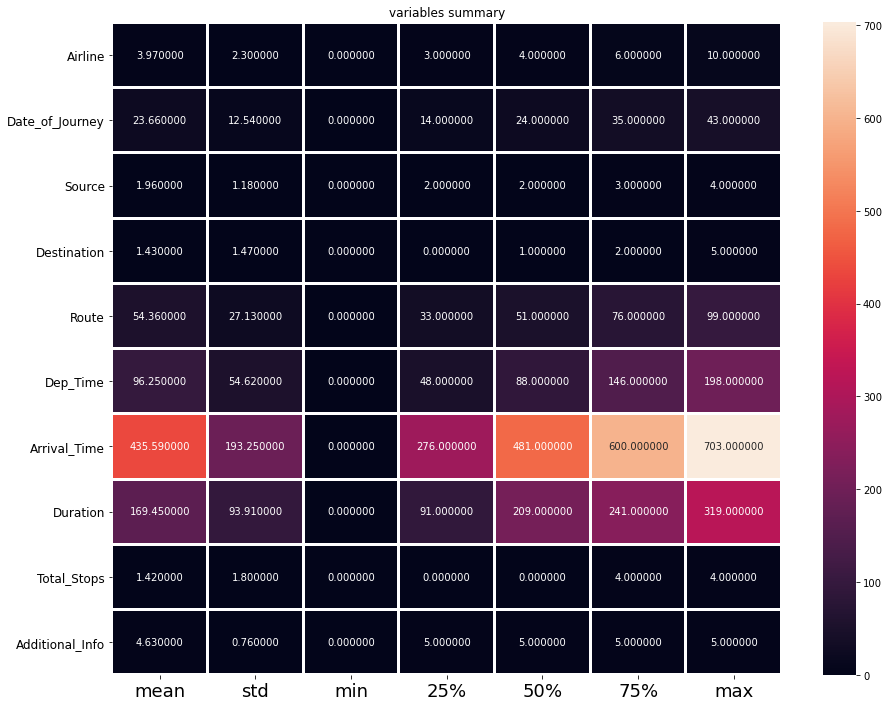

In [104]:
plt.figure(figsize=(15,12))
sns.heatmap(round(df.describe()[1:].transpose(),2), linewidth=2, annot=True, fmt="f")
plt.xticks(fontsize=18)
plt.yticks(fontsize=12)
plt.title("variables summary")
plt.show()

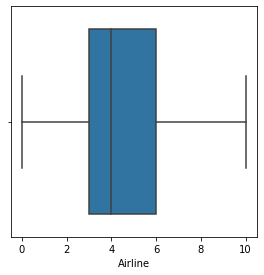

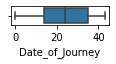

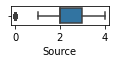

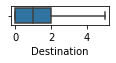

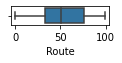

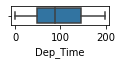

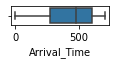

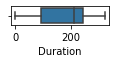

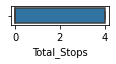

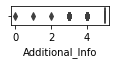

In [105]:
#checking outliers
plt.figure(figsize=(15,50))
graph=1
for column in df:
    if graph<=30:
        ax=plt.subplot(10,3,graph)
        sns.boxplot(df[column], orient='v')
        plt.xlabel(column, fontsize=10)
    graph+=1
    plt.show()

In [106]:
#Two cols observed with outliers-1.Source 2. Additional_info

In [107]:
#checking for continous values
df.Source.unique()

array([2, 3, 0, 4, 1])

In [109]:
#checking for continous values
df.Additional_Info.unique()

array([5, 3, 4, 0, 1, 2])

In [ ]:
#both cols doesn have continous data, Decided not to treat outliers

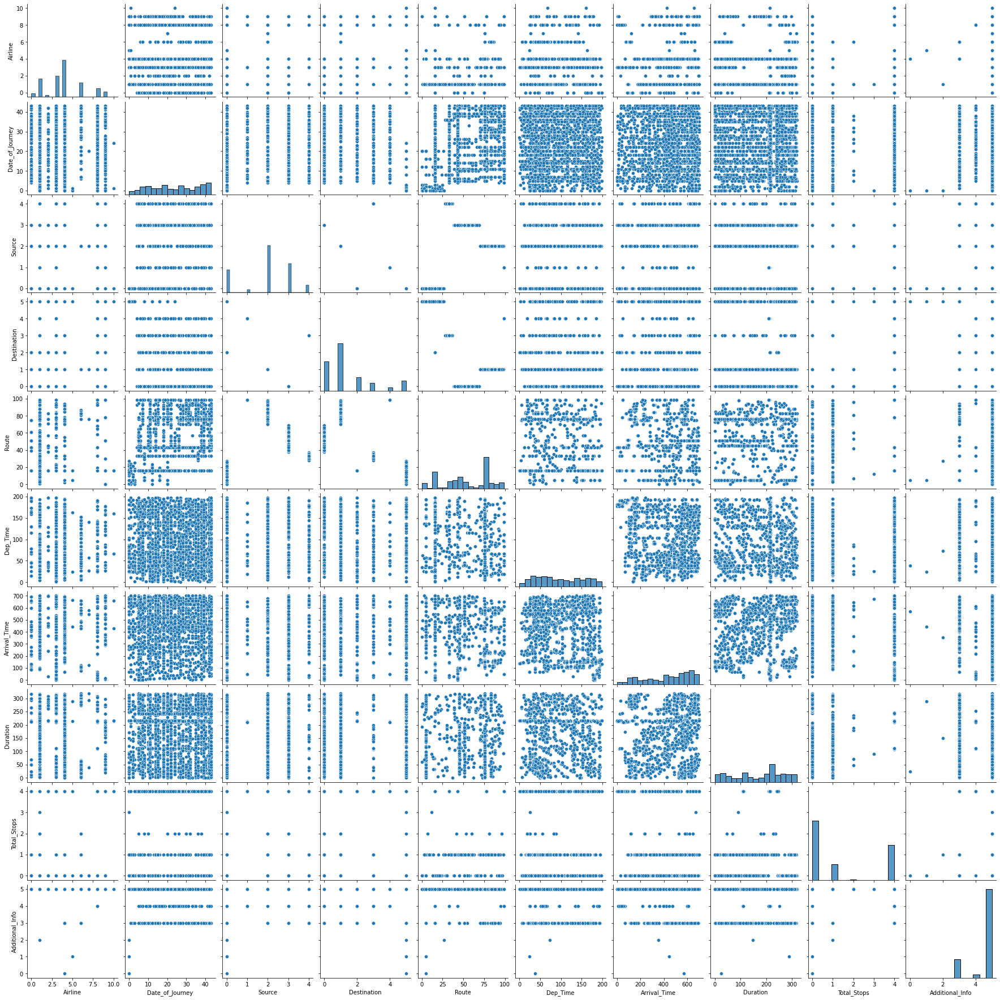

In [110]:
##plot for understanding relation between cols.
sns.pairplot(df)
plt.show()

In [111]:
df.skew()

Airline            0.483882
Date_of_Journey   -0.044181
Source            -0.424997
Destination        1.263630
Route             -0.281807
Dep_Time           0.178928
Arrival_Time      -0.523661
Duration          -0.275404
Total_Stops        0.672623
Additional_Info   -1.719119
dtype: float64

In [ ]:
# skewness is observed in 3 cols:Destination,Total_stops and Additional_Info

In [112]:
#checking for continous values
df.Destination.unique()

array([1, 0, 2, 5, 3, 4])

In [114]:
df.Total_Stops.unique()

array([0, 4, 1, 2, 3])

In [ ]:
# all three cols. having skewness is not continous type, hence not treating for skewness